In [1]:
%reset -f

## **Script exctration**

Chargement de librairies

In [2]:
!pip install elasticsearch

from elasticsearch import Elasticsearch
from elasticsearch.helpers import scan
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from scipy.stats import linregress
from datetime import datetime, date, timedelta
from matplotlib import pyplot as plt
import seaborn as sns; sns.set()

In [3]:
# Acces elasticsearch
login = "jean-myriam.s"
password = "!123awfnk123!"

# connection to elasticsearch
es = Elasticsearch(
    "https://wapp-gbg-elasticsearch-dev.azurewebsites.net:443/elastic/",
    basic_auth=(login, password)
)

#### Class Raw_eqv_millier

In [4]:
class Raw_eqv_millier:
    
  def __init__(self, sn:str, variable:str, date_start:str, date_end:str) -> None:
    self.__sn = sn
    self.__variable = variable
    self.__date_start = date_start
    self.__date_end = date_end
  @property
  def sn(self):
    return self.__sn
  @property
  def variable(self):
    return self.__variable
  @property
  def date_start(self):
    return self.__date_start
  @property
  def date_end(self):
    return self.__date_end

  def raw_data(self):
    # N° indicateur
    var2 = self.__variable.replace("rawAlarms.","")
    var2 = var2.replace("rawDefaults.","")
    var2 = var2.replace("rawMessages.","")
    #-------------------------------------------
    var2 = var2.replace("packingAlarms.","")
    var2 = var2.replace("packingDefaults.","")
    var2 = var2.replace("packingMessages.","")
    # Categorie d'indicateur
    var1 = self.__variable.replace(var2, "")
    var1 = var1.replace(".", "")
    # formater string "{'xxx': "
    s = '{' + "'{}': ".format(var2)

    es_rqt = {
      "_source": ["date", "packingCount", self.__variable],
      "query": {
        "bool": {
          "must":[
            {
              "range": {
                "date": {"gte":self.__date_start,
                        "lte":self.__date_end}
              }
            },
            {
            "bool": {
          "must": [
            {
              "match": {
                "machineSerialNumber" :self.__sn
              }
            },
            {
              "match": {
                "dateInterval" : 3
              }
            }
          ]
        } } ] } } }

    # extract
    extract = scan(client=es,
              query= es_rqt,
              scroll='1m',
              index='stream-reporting-machinetechnicals',
              raise_on_error=True,
              preserve_order=False,
              clear_scroll=True)

    list_hits = list(extract)
    list_dict = []
    for hit in list_hits:
      list_dict.append(hit['_source'])
    df = pd.DataFrame(list_dict)
    #---------------------------------------------------------------------------------
    if len(df) !=0 and var1 in df.columns:
      df["date"] = pd.to_datetime(df["date"]).apply(lambda x: x.date)
      df[var1] = df[var1].astype(str)
      df[var1] = df[var1].str.replace(s, "", regex=False)
      df[var1] = df[var1].str.replace("}", "", regex=False)
      df[var1] = df[var1].apply(lambda x: x if x != 'nan' else np.NaN)
      df[var1] = pd.to_numeric(df[var1])
      df.rename(columns={var1:self.__variable}, inplace=True)

      df.drop_duplicates(inplace=True)
      df.sort_values('date', inplace=True)
      df.reset_index(drop = True, inplace=True)

      df.insert(2, 'packingCount_cum', df['packingCount'].cumsum())
      df.insert(2, f'{self.__variable}_cum', df[self.__variable].cumsum())
      #variable packing
      df['packing']=(df[self.__variable]/df['packingCount'])*1000
    return df

  def data(self):
    #Table POINTS MILLIERS
    df= self.raw_data()
    if len(df)==0 or self.__variable not in df.columns:
      tb_pm = None

    else: #len(df) !=0:
      modulo = df['packingCount_cum'].max()//1000
      list_pt_millier =[]
      list_pas_mille = []
      for i in range(1, modulo+1):
        #--
        pm = df[np.logical_and(df['packingCount_cum']>=(1000*i), df['packingCount_cum']<=((1000*i)+500))].head(1)
        if len(pm) != 0:
          list_pt_millier.append(pm)
          list_pas_mille.append(1000*i)
      if len(list_pt_millier)>0:
        tb_pm = pd.concat(list_pt_millier)
        tb_pm.drop_duplicates(["date", self.__variable,	f'{self.__variable}_cum', 'packingCount_cum', 'packingCount', 'packing'], inplace=True, ignore_index=True)
        # raw equivalent milliers
        tb_pm["raw_eqv_millier"]= ((tb_pm[f'{self.__variable}_cum']-tb_pm[f'{self.__variable}_cum'].shift())/(tb_pm['packingCount_cum']-tb_pm['packingCount_cum'].shift())*1000)
        tb_pm['Nbr_bt_total_machine'] = len(tb_pm)*[df.packingCount_cum.max()]
      else:
        tb_pm = None
    return tb_pm

  def plot(self):
    return self.data()[['packingCount_cum', 'raw_eqv_millier']].dropna().plot('packingCount_cum', 'raw_eqv_millier', kind='scatter', xlim=[0, 300000], ylim=[0, 700], figsize=(25, 8))


## **fonctions graphs**

Définir la variable 'today' à la date du jour

In [5]:
today = date.today()

fonctions

In [6]:
def graph(sn, dateStart, datEnd=today, id_broyeur= 'identifiant broyeur', xmax=1000000, ymax=800, id_red_pt=0):
  plt.figure(figsize=(20, 8))
  plt.xlabel("packingCount_cum")
  plt.ylabel("raw_eqv_millier")
  #-----test-----
  if datEnd == today:
    d=Raw_eqv_millier(sn, "rawAlarms.401", dateStart, datEnd).data()
    d=processing(d) # ici nvo
    plt.scatter(d["packingCount_cum"], d["raw_eqv_millier"], color ='grey',  label= id_broyeur)
    #--------
  else: #différentiation de la séquence détecté (en rouge) et reste en gris
    dateStart = str(dateStart)
    datEnd = str(datEnd) #
    don =Raw_eqv_millier(sn, "rawAlarms.401", dateStart, today).data()
    don=processing(don) # ici nvo
    #----------------------------------------------------------------------
    date_debCS = datetime.strptime(datEnd, "%Y-%m-%d").date() + timedelta(1)
    #-------------------------------------------------------------------

    d = don[don.date<date_debCS]
    plt.scatter(d["packingCount_cum"], d["raw_eqv_millier"],  color ='red',  label= id_broyeur)
    #---
    # reste = don[don['date']>=(datetime.strptime(datEnd, "%Y-%m-%d")+timedelta(1)).date()] #désactivé ==>auj
    reste = don[don['date']>=date_debCS] #écrit ==>auj (revient au 1er désactivé)
    plt.scatter(reste["packingCount_cum"], reste["raw_eqv_millier"], color ='grey')
    #---
  plt.ylim([0, ymax])
  plt.xlim([0, xmax])
  plt.legend(loc="best")

In [7]:
# fonction graph sur les données brut packing bdata
def graph_raw(sn, dateStart, datEnd=today, id_broyeur= 'identifiant broyeur', xmax=500000, ymax=800, id_red_pt=0):
  plt.figure(figsize=(20, 8))
  plt.xlabel("packingCount_cum")
  plt.ylabel("packing")
  #----------
  if datEnd == today:
    d=Raw_eqv_millier(sn, "rawAlarms.401", dateStart, datEnd).raw_data()
    d = d.replace([np.inf, -np.inf], np.nan)
    d= d.dropna()
    plt.plot(d["packingCount_cum"], d["packing"], color ='grey',  label= 'All data')
    #--------
  else: #différentiation de la séquence détecté (en rouge) et reste en gris
    dateStart = str(dateStart)
    datEnd = str(datEnd)
    don =Raw_eqv_millier(sn, "rawAlarms.401", dateStart, today).raw_data()
    don = don.replace([np.inf, -np.inf], np.nan)
    don= don.dropna()
    #----------------------------------------------------------------------
    date_debCS = datetime.strptime(datEnd, "%Y-%m-%d").date() + timedelta(1)
    #-------------------------------------------------------------------
    d = don[don.date<date_debCS]
    plt.plot(d["packingCount_cum"], d["packing"],  color ='red',  label= id_broyeur)
    #---
    reste = don[don['date']>=date_debCS]
    plt.plot(reste["packingCount_cum"], reste["packing"], color ='grey')
    #---
  plt.ylim([0, ymax])
  plt.xlim([0, xmax])
  plt.legend(loc="best")

In [8]:
# fonction graph last cycle: utilisable dans la fonction machine_graphs
def graph_raw_dc(sn, dateStart, datEnd=today, id_broyeur= 'identifiant broyeur', xmax=500000, ymax=800, id_red_pt=0):
  plt.figure(figsize=(20, 8))
  plt.xlabel("packingCount_cum")
  plt.ylabel("packing")
  #-----analyse données-----
  d=Raw_eqv_millier(sn, "rawAlarms.401", dateStart, today).raw_data()
  d = d.replace([np.inf, -np.inf], np.nan)
  d= d.dropna()

  potentiel = d[d['date']>datEnd]
  if datEnd == today or len(potentiel)<10 :
    plt.plot(d["packingCount_cum"], d["packing"], color ='grey',  label= id_broyeur)
  else: #différentiation de la séquence potentiel new cycle (en orange)
    plt.plot(d["packingCount_cum"], d["packing"], color ='grey',  label= id_broyeur)
    plt.plot(potentiel["packingCount_cum"], potentiel["packing"], color ='orange',  label= 'potential new cycle')

  plt.ylim([0, ymax])
  plt.xlim([0, xmax])
  plt.legend(loc="best")

# **Cycles Identifications Fonctions**

In [9]:
#FONCTION break_pt avec PREPROCESSING
from pandas import DataFrame
def break_pt(tb:DataFrame):
  #Recherche d'une concavité
  maxi = 0
  idx_maxi = None
  pente = None
  idx_min_ref = None
  nb_bt_suiv_verif = None
  plage_verif = None
  break_found  =False
  for i in tb.index:
    pt_val = tb['raw_eqv_millier'][i]
    if maxi < pt_val:
      maxi = pt_val
      idx_maxi = i
    else:
      pente = pt_val - maxi
      if maxi>500:
        desc_min = 200
      elif maxi>350:
        desc_min = 150
      elif maxi>200 :
        desc_min = 100
      elif maxi>130:
        desc_min = 65
      else:
        desc_min = 55
      if pente <= - desc_min:
        idx_min_ref = i
        nb_bt_suiv_verif = 50000
        plage_verif=tb[tb['packingCount_cum']<tb['packingCount_cum'][i] + nb_bt_suiv_verif][i:]
        coef = 2/3 if np.abs(pente)<100 else 1/2

        if (plage_verif['raw_eqv_millier']>=(tb['raw_eqv_millier'][i]+np.abs(coef*pente))).sum()==0 and len(tb[:i].dropna())>3:
          if len(tb[:i].dropna())>4:
            break_found = True
            break
          elif maxi > 300:
            break_found = True
            break
          else: # len(tb[:i].dropna())<4:
            maxi=0 # reinitialiser

  if break_found == True:
    result = tb.iloc[[idx_min_ref]]
    #-------------------------------------
  else:
    #pas de break, renvoi point de rupture au dernier
    result = tb.iloc[[-1]]
  return result

# **Dev de l'algo**

## data processing functions

In [10]:
def out_filter_std(data_period, coef=1.25):
  out_idx = []
  for i in data_period.index:
    if np.abs((data_period['raw_eqv_millier'].iloc[i] - data_period['raw_eqv_millier'].mean())/data_period['raw_eqv_millier'].std()) > coef:
      out_idx.append(i)
  data_period.drop(out_idx, axis=0, inplace=True)
  data_period.reset_index(drop=True, inplace=True)
  return data_period, len(out_idx)

In [11]:
def processing(don_brut, period_len = 20000):
  don_brut = don_brut.dropna()
  if len(don_brut) < 7:
    don = pd.DataFrame()
  else:
    list_seq_don_net=[]
    nb_period = don_brut['packingCount_cum'].iloc[-1]//period_len
    if don_brut['packingCount_cum'].iloc[-1]%period_len>0:
      nb_period = nb_period+1

    for i in range(1, nb_period+1):
      period = don_brut[np.logical_and(don_brut['packingCount_cum']>= ((i-1)*period_len),don_brut['packingCount_cum']<(i*period_len))]
      period.reset_index(drop=True, inplace=True)
      #initialisation while
      init = 1
      while init!=0:
        filtre=None
        nb_out = None

        filtre = out_filter_std(period)
        period = filtre[0]
        nb_out = filtre[1]
        init = nb_out
      list_seq_don_net.append(period)

    don = pd.concat(list_seq_don_net)
    don = don.reset_index(drop=True)
  return don

In [12]:
from sklearn.linear_model import RANSACRegressor
# fonction cycles_stats
def cy_stats(rp):
  rp = rp.reset_index(drop=True)
  list_linear_compatibility =[]
  list_R2_adjustment = []
  list_slope = []
  list_intercept = []

  list_std_dev_1er_tier  = []
  list_std_dev_2ex_tier = []
  list_std_dev_3em_tier = []

  list_mediane_1er_tier  = []
  list_mediane_2ex_tier = []
  list_mediane_3em_tier = []
  # list_first_pt_reg_line = []
  list_last_pt_reg_line = []

  #confiance
  list_d_conf =[]
  list_med_10pts_av = []
  list_med_10pts_ap = []


  for i in range(len(rp)):
    cdf = Raw_eqv_millier(rp['sn'][i], "rawAlarms.401", rp['date_start'][i], rp['date_end'][i]).raw_data()
    cdf = cdf.replace([np.inf, -np.inf], np.nan)
    cdf = cdf.dropna()

    #--------------------------linear regression (MCO)-----------------------
    creg = linregress(cdf.packingCount_cum, cdf.packing) # MCO
    linear_compatibility = (1 - creg.pvalue)*100 #global significativity for linear model
    # R2_adjustment = ((creg.rvalue)**2)*100  # R2
    # slope = creg.slope
    # intercept = creg.intercept
    #--------------------------RANSAC linear regression-----------------------
    #--------------Robust method that identifies and ignores outliers-----------
    X = np.array(cdf.packingCount_cum)
    X = X.reshape(-1, 1)
    y = np.array(cdf.packing)
    ransac = RANSACRegressor(random_state=42).fit(X, y)
    R2_adjustment = ransac.score(X[ransac.inlier_mask_], y[ransac.inlier_mask_])*100
    slope =  ransac.estimator_.coef_[0]
    intercept = ransac.estimator_.intercept_
    #-----------------------------------------------------------------------------------
    #-------------------------------d_conf calcul----------------------------------------
    if i < len(rp)-1:
      ref = cdf['packing'].tail(10).median()
      list_med_10pts_av.append(ref)
      #les 10 1ers pts du cycle suivant
      key_conf = Raw_eqv_millier(rp['sn'][i+1], "rawAlarms.401", rp['date_start'][i+1], rp['date_end'][i+1]).raw_data()
      key_conf = key_conf.replace([np.inf, -np.inf], np.nan)
      key_conf = key_conf.dropna()
      key_conf = key_conf.head(10)
      med_10pts_ap = key_conf['packing'].median()
      list_med_10pts_ap.append(med_10pts_ap)
      #calcul de pourcentage par points
      alpha = (100/len(key_conf))/ref # gain de pourcentage de confiance par écartement de point par rapport à la reference du cycle precedent
      key_conf['prop_conf'] = key_conf['packing'].apply(lambda x: (ref-x)*alpha  if (ref-x)>=-ref else -100/len(key_conf))
      d_conf = max(key_conf['prop_conf'].sum(), 0)
      list_d_conf.append(d_conf)
    else: # i au dernier cycle
      list_d_conf.append(np.nan)
      list_med_10pts_av.append(np.nan)
      list_med_10pts_ap.append(np.nan)
    #------------------------------------------------------------------------------------

    # ajout colonne des ecarts
    cdf['deviation'] = cdf['packing'] - (slope*cdf['packingCount_cum'] + intercept)
    # limites de séquençage
    plage_bt_cum = cdf['packingCount_cum'].iloc[-1] - cdf['packingCount_cum'].iloc[0]
    lim_1tier = cdf['packingCount_cum'].iloc[0] + plage_bt_cum/3
    lim_2tier = cdf['packingCount_cum'].iloc[0] + (plage_bt_cum *2/3)
    lim_3tier = cdf['packingCount_cum'].iloc[-1]
    # std deviation
    std_dev_1er_tier  = (((cdf['deviation'][cdf['packingCount_cum'] <= lim_1tier])**2).mean())**0.5
    std_dev_2ex_tier = (((cdf['deviation'][np.logical_and(cdf['packingCount_cum']> lim_1tier , cdf['packingCount_cum'] <= lim_2tier)])**2).mean())**0.5
    std_dev_3em_tier  = (((cdf['deviation'][np.logical_and(cdf['packingCount_cum']> lim_2tier , cdf['packingCount_cum'] <= lim_3tier)])**2).mean())**0.5
    # medianes
    mediane_1er_tier  = np.median(cdf['packing'][cdf['packingCount_cum'] <= lim_1tier])
    mediane_2ex_tier = np.median(cdf['packing'][np.logical_and(cdf['packingCount_cum']> lim_1tier , cdf['packingCount_cum'] <= lim_2tier)])
    mediane_3em_tier = np.median(cdf['packing'][np.logical_and(cdf['packingCount_cum']> lim_2tier , cdf['packingCount_cum'] <= lim_3tier)])
    # first point of the regression line
    first_pt_reg_line = slope*cdf['packingCount_cum'].iloc[0] + intercept
    # last point of the regression line
    last_pt_reg_line = slope*cdf['packingCount_cum'].iloc[-1] + intercept
    # ajout aux listes
    list_linear_compatibility.append(linear_compatibility)
    list_R2_adjustment.append(R2_adjustment)
    list_slope.append(slope)
    list_intercept.append(intercept)
    list_std_dev_1er_tier.append(std_dev_1er_tier)
    list_std_dev_2ex_tier.append(std_dev_2ex_tier)
    list_std_dev_3em_tier.append(std_dev_3em_tier)
    list_mediane_1er_tier.append(mediane_1er_tier)
    list_mediane_2ex_tier.append(mediane_2ex_tier)
    list_mediane_3em_tier.append(mediane_3em_tier)
    # list_first_pt_reg_line.append(first_pt_reg_line)
    list_last_pt_reg_line.append(last_pt_reg_line)

  return DataFrame({'linear_compatibility (%)':list_linear_compatibility, 'R2_adjustment (%)':list_R2_adjustment, 'slope':list_slope, 'intercept':list_intercept,
            'std_dev_1er_tier':list_std_dev_1er_tier, 'std_dev_2ex_tier':list_std_dev_2ex_tier, 'std_dev_3em_tier':list_std_dev_3em_tier, 'med_1er_tier':list_mediane_1er_tier,
            'med_2ex_tier':list_mediane_2ex_tier, 'med_3em_tier':list_mediane_3em_tier, 'last_pt_reg_line':list_last_pt_reg_line,
            'd_conf': list_d_conf, 'med_10pts_av' : list_med_10pts_av, 'med_10pts_ap' : list_med_10pts_ap})

## cycle_detector function

In [13]:
def cycle_detector(sn:str, start:str, end:str):
  # initialisations
  verif_new_start=0
  don_zero = Raw_eqv_millier(sn, "rawAlarms.401", start, end).data()
  if isinstance(don_zero, pd.DataFrame) :
  # au moins 10 pts de données avant 200 000 bt pour passer à la détermination de trajectoire
  # sinon débuter la détermination des traj à partir du 1er points < 100 après 200000
    sequence_av_200000 = don_zero[['raw_eqv_millier']][don_zero['packingCount_cum']<200000].dropna()
    if np.logical_and(len(sequence_av_200000) < 10, len(don_zero[don_zero['packingCount_cum']>200000])>10):
      for i in don_zero[don_zero['packingCount_cum']>200000].index:
        if don_zero['raw_eqv_millier'][i]<100:
          new_start = don_zero.iloc[i].date
          don_brut = Raw_eqv_millier(sn, "rawAlarms.401", new_start, end).data()
          verif_new_start =1
          break
        else:
          rez = None # "No cycle detected"
    else:
      don_brut=don_zero

    #processing data
    don = processing(don_brut)

    list_cycles = []
    date_initiale = start if verif_new_start==0 else new_start
    #date_initiale = don.head(1).date.iloc[0]

    while len(don)>= 7: #au moins 7 pts pour détecter et qualifier le cycle
      # extraitre une sous table légere avec 'date', 'packingCount_cum', 'raw_eqv_millier'
      table = don.loc[:, ['date', 'packingCount_cum', 'raw_eqv_millier']]

      #================================utilisation fct break_pt compatible au processing======================================
      break_point = break_pt(table)
      date_break_point = break_point.date.iloc[0]
      #=====================================================================================================================


      #============ precision de la date_break_point : recherche dans les données brut (don base)===========================
      #============ Sans extention de la seq de break dans les données de base =============================================

      #Dernier point dans don avant le date_break_point
      pt_av_break_point= don[don['date']<date_break_point].tail(1)
      date_av_break_point = pt_av_break_point.date.iloc[0]
      # seq_break: don_brut entre date_av_break_point et date_break_point
      seq_break = Raw_eqv_millier(sn, "rawAlarms.401", date_av_break_point, date_break_point ).raw_data().loc[:, ['date', 'packing']]
      seq_break = seq_break.replace([np.inf, -np.inf], np.nan) # don base
      seq_break = seq_break.dropna()
      if len(seq_break)<=2:
        date_break_point_ajst = date_break_point
      else:
        seuil = break_point.raw_eqv_millier.iloc[0] + 1/2*(pt_av_break_point.raw_eqv_millier.iloc[0] - break_point.raw_eqv_millier.iloc[0])
        #le break est au 1er pt qui descent en desous du medium sans qu'aucun point n'en ressorte
        seq_break['under_seuil']=seq_break['packing'].apply(lambda x: True if x<=seuil else False)
        seq_break = seq_break.reset_index(drop=True)
        for id in range(len(seq_break)):
          if list(seq_break.under_seuil)[id]==True and False not in list(seq_break.under_seuil)[id:]:
            break
        break_point_ajst = seq_break.iloc[[id]]
        date_break_point_ajst = break_point_ajst.date.iloc[0]
      #=========================================================================================================================
      #Délimitation du cycle
      if date_break_point_ajst != don.tail(1).date.iloc[0]:
        # La date de début du cycle suivant est alors
        date_debCS = date_break_point_ajst
        # on déduit la date de fin de notre cycle (cycle précédent)
        date_finCX = date_debCS - timedelta(1)
        #date_finCX = date_break_point_ajst
        date_debCX = date_initiale
        #append cycle à la cycle list
        cycle = [date_debCX, date_finCX]
        list_cycles.append(cycle)
        #réinitialiser la date_initiale
        date_initiale = date_debCS

      else: #(date_break_point_ajust = don.tail(1).date.iloc[0])
        date_finCX = date_break_point_ajst
        date_debCX = date_initiale
        #append cycle à la cycle list
        cycle = [date_debCX, date_finCX]
        list_cycles.append(cycle)

      #Réinilialiser don
      if date_break_point_ajst != table.tail(1).date.iloc[0]:
        don_brut = Raw_eqv_millier(sn, "rawAlarms.401", date_initiale, end).data()
        if isinstance(don_brut, pd.DataFrame)==True:
          don = processing(don_brut)
        else: #isinstance(don_brut, pd.DataFrame)==False
          don = pd.DataFrame() #(len = 0)
      else: #(date_break_point_ajst = don.tail(1).date.iloc[0])
        don = pd.DataFrame() #(len = 0)

    #présenter caractéristiques des cycles:
    if len(list_cycles) !=0:
      rez_part = pd.concat([pd.DataFrame([sn]*len(list_cycles), columns=['sn']),pd.DataFrame(list_cycles, columns=['date_start', 'date_end'])], axis=1)
      # ajout col nbr bouteilles
      for row in range(len(rez_part)):
        rez_part.loc[row:row, ['Nbr_bt_cum']]=Raw_eqv_millier(sn, "rawAlarms.401", rez_part['date_start'][row], rez_part['date_end'][row]).raw_data().packingCount_cum.max()
      #ajout stats
      stat_df = cy_stats(rez_part)
      rez = pd.concat([rez_part, stat_df], axis=1)
    else:
      rez = None # "No cycle detected"
      print("No cycle detected")
    return rez

#**Fonctions machine_graphs et cy_graph**

In [14]:
def machine_graphs(rps):
  rps = rps.reset_index(drop=True)
  graph_raw(rps['sn'][0], rps['date_start'].iloc[0], today, xmax=1000000)
  if len(rps)==1:
    num_B =1
    id_cycle = 'C'+ rps['sn'].iloc[0] + str(num_B).zfill(2)
    graph_raw_dc(rps['sn'].iloc[0], rps['date_start'].iloc[-1], rps['date_end'].iloc[-1], id_cycle)
  else:
    num_B=0
    for i, j in zip(rps['date_start'].iloc[:-1], rps['date_end'].iloc[:-1]):
      num_B +=1
      id_cycle = 'C'+ rps['sn'].iloc[0] + str(num_B).zfill(2)
      graph_raw(rps['sn'].iloc[0], i, j, id_cycle)

    num_B +=1
    id_cycle = 'C'+ rps['sn'].iloc[0] + str(num_B).zfill(2)
    graph_raw_dc(rps['sn'].iloc[0], rps['date_start'].iloc[-1], rps['date_end'].iloc[-1], id_cycle)

In [15]:
# fonction graph sur les données brut packing bdata
def cy_graph(sn, dateStart, datEnd, xmax=500000, ymax=800):
  plt.figure(figsize=(20, 8))
  plt.xlabel("packingCount_cum")
  plt.ylabel("packing")

  d=Raw_eqv_millier(sn, "rawAlarms.401", dateStart, datEnd).raw_data()
  d = d.replace([np.inf, -np.inf], np.nan)
  d= d.dropna()
  plt.plot(d["packingCount_cum"], d["packing"], color ='grey', label=f'M{sn}: {dateStart} to {datEnd}')

  plt.ylim([0, ymax])
  plt.xlim([0, xmax])
  plt.legend(loc="best")

# **Pre-Process AUTO New**




### **Eléments d'interprétation des indicateurs**

**Fonctionnement de l'algo**

Le fonctionnement de l'algo est optimal sur les cas classiques de distribution suivant une trend linéaire croissante, achevée par une chute brusque. les cas complexes très éloignés de ce pattern considéré comme nominal ici, sont identifiés comme les cas étranges ou atypiques  




**Facteurs caractéristiques des cas étranges/atypiques:**

------------------------------------------------------------------------------------
_Facteurs liés à la distribution des points_

compatibilité linéaire faible: <80% ==> soupçon légitime de cas atypique  (points très dispersé et/ou très peu de points)**

R2 très faible : < 50 % ==> soupçon légitime de cas atypique (conséquence d'une faible compatibilité linéaire et ou d'une forte variabilité des points) **

Std_dev (variabilité) très forte au 1er et ou au dernier tier  (>100 |>250) **

-------------------------------------------------------------------------------

_Facteurs liés aux pentes_

slope nulle ou très faible : en dessous de 20/10000 ==> On est sur evolution quasi constante "plateau", s'étendant d'autant plus que le nbr de bouteilles cumulées est élevé

slope négative: pente négatives (évolution décroissante)

-------------------------------------------------------------------------------

**
_Caractéristique succeptible d'impacter la précision de détection des cycles_


**Autres Informations sur la distribution des points**


intercept;
std ;
median

## Période d'analyse

In [16]:
date_debut = "2019-11-01"
date_fin = today

## objets de sauvegarde des sorties

In [17]:
# liste instance des résultats
list_cycles_board = []
list_mach_none = []

## Batch 0 : 1 - 59

In [18]:
list_tb_results = []

In [21]:
m_1er = 1
m_der = 59
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

AuthenticationException: AuthenticationException(401, 'security_exception', 'missing authentication credentials for REST request [/stream-reporting-machinetechnicals/_search?scroll=1m]')

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(1, 59+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 1 : 60 - 70

In [20]:
list_tb_results = []

In [ ]:
m_1er = 60
m_der = 70
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

No cycle detected


In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(60, 70+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 2: 71 - 80

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 71
m_der = 80
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

No cycle detected


In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(71, 80+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 3: 81-90

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 81
m_der = 90
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(81, 90+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 4: 91- 100

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 91
m_der = 100
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(91, 100+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 5: 101-110

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 101
m_der = 110
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(101, 110+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 6: 111-120

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 111
m_der = 120
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(111, 120+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 7: 121-130

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 121
m_der = 130
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(121, 130+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 8: 131-140

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 131
m_der = 140
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(131, 140+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 9: 141-150

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 141
m_der = 150
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

No cycle detected


In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(141, 150+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 10: 151-160

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 151
m_der = 160
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(151, 160+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 11: 161-200

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 161
m_der = 200
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

No cycle detected
No cycle detected
No cycle detected
No cycle detected


In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(161, 200+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 12: 201-250

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 201
m_der = 250
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(201, 250+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 13: 251-350

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 251
m_der = 350
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(251, 350+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 14: 351-400

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 351
m_der = 400
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(351, 400+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

## Batch 15: 401 - 566

In [ ]:
list_tb_results = []

In [ ]:
m_1er = 401
m_der = 566
#----------------------------------------------------
for m in range(m_1er, m_der+1):
  num_mach= str(m).zfill(5)
  tb_res = cycle_detector(num_mach, date_debut, date_fin)
  list_tb_results.append(tb_res)
  if isinstance(tb_res, pd.DataFrame)!=True:
    list_mach_none.append(num_mach)

In [ ]:
# table resultats
Cycles_board = pd.concat(list_tb_results)
Cycles_board.reset_index(drop=True, inplace=True)
list_cycles_board.append(Cycles_board)
# Cycles_board

In [ ]:
# #---------voir graphs-------------------------------
# for i in range(401, 566+1):
#   num= str(i).zfill(5)
#   if num in Cycles_board['sn'].unique():
#     rp = Cycles_board[Cycles_board['sn']==num]
#     machine_graphs(rp)

# Résultats des détections de cycle sur le parc dans la table Detect_res

In [ ]:
Detect_res = pd.concat(list_cycles_board)
Detect_res = Detect_res.reset_index(drop=True)
Detect_res.to_csv('Detect_res.csv')
Detect_res

,sn,date_start,date_end,Nbr_bt_cum,linear_compatibility (%),R2_adjustment (%),slope,intercept,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier,last_pt_reg_line,d_conf,med_10pts_av,med_10pts_ap
0,00001,2019-11-01,2023-07-21,325065.0,100.000000,91.112123,0.001404,-109.258258,32.129734,50.646325,68.507514,54.216867,148.226797,297.808887,347.221455,NaN,NaN,NaN
1,00002,2019-11-01,2023-07-22,283263.0,100.000000,85.686008,0.000990,-56.602169,244.604260,45.197985,102.599393,61.255743,79.721181,193.146327,223.954906,NaN,NaN,NaN
2,00003,2019-11-01,2021-12-26,235297.0,99.970588,12.216063,0.000146,27.587584,15.244524,19.315393,31.642800,51.664081,60.648801,74.474681,61.930047,64.839973,55.420710,17.216227
3,00003,2021-12-27,2023-04-17,376871.0,100.000000,93.453228,0.001819,-18.696939,29.130958,124.977879,98.043116,65.420561,299.504950,513.150516,666.762914,89.865824,549.177954,53.976335
4,00003,2023-04-18,2023-07-21,101271.0,99.670538,48.281573,0.000172,49.027152,12.212324,16.766080,16.364898,53.951368,51.635265,66.453163,66.475016,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,00546,2019-11-01,2023-07-24,113352.0,79.410036,28.170031,0.000079,35.203456,14.568861,10.773363,12.085861,37.319763,38.424725,42.060988,44.190390,NaN,NaN,NaN
778,00548,2019-11-01,2023-07-24,23084.0,95.657031,1.901108,-0.000069,10.980442,22.169242,9.759223,9.277079,12.987013,10.537408,12.578616,9.377382,NaN,NaN,NaN
779,00549,2019-11-01,2023-07-24,23389.0,91.056291,22.395046,0.000275,11.888614,25.544470,7.761738,11.348808,18.487395,16.537145,20.080321,18.325031,NaN,NaN,NaN
780,00551,2019-11-01,2023-07-24,28302.0,52.441273,49.730979,0.000440,15.512842,19.475487,14.461069,8.878619,19.656020,27.232618,30.265697,27.979685,NaN,NaN,NaN


=========================================================================================

# recharge résultats

In [ ]:
#===================recharge les résultats d'hier==================
from google.colab import files
uploaded = files.upload()


Saving Gbl_res_20_7.csv to Gbl_res_20_7.csv


In [ ]:
save = pd.read_csv('Gbl_res_20_7.csv')
Detect_res = save.drop(['Unnamed: 0', 'cluster'], axis=1)
Detect_res

,sn,date_start,date_end,Nbr_bt_cum,linear_compatibility (%),R2_adjustment (%),slope,intercept,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier,last_pt_reg_line,d_conf,med_10pts_av,med_10pts_ap
0,1,2019-11-01,2023-07-20,324313.0,100.000000,91.009950,0.001402,-108.980301,32.014502,50.528830,68.677076,54.074726,147.902870,297.188755,345.835657,NaN,NaN,NaN
1,2,2019-11-01,2023-07-20,282315.0,100.000000,85.440286,0.000989,-56.394868,245.189318,44.802894,102.857725,61.240116,79.545455,189.845080,222.796317,NaN,NaN,NaN
2,3,2019-11-01,2021-12-26,235297.0,99.970588,12.216063,0.000146,27.587584,15.244524,19.315393,31.642800,51.664081,60.648801,74.474681,61.930047,64.839973,55.420710,17.216227
3,3,2021-12-27,2023-04-17,376871.0,100.000000,93.453228,0.001819,-18.696939,29.130958,124.977879,98.043116,65.420561,299.504950,513.150516,666.762914,89.865824,549.177954,53.976335
4,3,2023-04-18,2023-07-17,95338.0,98.571802,28.093736,-0.000128,60.930242,13.792206,16.722502,21.936865,52.706553,56.924384,60.743063,48.733053,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765,538,2019-11-01,2023-07-14,33246.0,99.085640,49.475960,0.000290,13.390684,23.792291,4.463119,8.111408,20.759203,17.695965,15.258216,23.042708,NaN,NaN,NaN
766,539,2019-11-01,2023-07-14,36126.0,99.934697,82.066893,0.000800,8.097729,18.155173,8.680950,11.614965,12.539185,15.659548,37.157123,37.015368,NaN,NaN,NaN
767,541,2019-11-01,2023-07-19,67412.0,57.485661,77.958913,0.000340,12.323873,19.864795,8.946038,9.933989,19.546282,18.612280,27.389500,35.242748,NaN,NaN,NaN
768,546,2019-11-01,2023-07-18,100014.0,90.691837,32.028083,0.000104,37.992218,15.165494,12.810658,12.880472,30.736619,39.900249,42.769625,48.421789,NaN,NaN,NaN


# Classification

La classification ayant pour but de regrouper les "Cycles de Vie Broyeurs" détectés selon leurs caractéristiques, elle se base sur l'analyse multidimensionnelle des parametres déterminant les cycles détectés.



Le modèle de regroupement employé est celui des K-means

Les résultats vont s'adapter automatiquement aux évolutions de l'indicateur sur les différentes machines. Nous avons ainsi un moyen de classifier de manière dynamique les cycles suivant leurs trajectoires donc de construire et actualiser en auto les trajectoires de référence

## PreProcess: preparation de la data pour la classification

In [ ]:
#classification dataframe
c_df = Detect_res.copy()
# # retirer cycle trend non "lineaire-compatible"
# c_df.drop(c_df[np.logical_or(c_df['linear_compatibility (%)']<50, c_df['R2_adjustment (%)']<50)].index, inplace=True)
#retrait cycles avec degré confiance sur la coupure finale < 25% (25% seuil acceptable pour les bonnes coupures)
c_df.drop(c_df[c_df['d_conf']<25].index, inplace=True)
# sélection des variables et retrait des lignes nan
c_df = c_df.loc[:, ['intercept', 'slope', 'Nbr_bt_cum', 'std_dev_1er_tier', 'std_dev_2ex_tier',	'std_dev_3em_tier',	'med_1er_tier', 'med_2ex_tier', 'med_3em_tier']].dropna()
c_df

,intercept,slope,Nbr_bt_cum,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier
0,-109.258258,0.001404,325065.0,32.129734,50.646325,68.507514,54.216867,148.226797,297.808887
1,-56.602169,0.000990,283263.0,244.604260,45.197985,102.599393,61.255743,79.721181,193.146327
2,27.587584,0.000146,235297.0,15.244524,19.315393,31.642800,51.664081,60.648801,74.474681
3,-18.696939,0.001819,376871.0,29.130958,124.977879,98.043116,65.420561,299.504950,513.150516
4,49.027152,0.000172,101271.0,12.212324,16.766080,16.364898,53.951368,51.635265,66.453163
...,...,...,...,...,...,...,...,...,...
777,35.203456,0.000079,113352.0,14.568861,10.773363,12.085861,37.319763,38.424725,42.060988
778,10.980442,-0.000069,23084.0,22.169242,9.759223,9.277079,12.987013,10.537408,12.578616
779,11.888614,0.000275,23389.0,25.544470,7.761738,11.348808,18.487395,16.537145,20.080321
780,15.512842,0.000440,28302.0,19.475487,14.461069,8.878619,19.656020,27.232618,30.265697


## modélisation KMeans

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
#paramètres de clustering
km = KMeans(n_clusters=40, random_state=42)

In [ ]:
#Avoir une idée des corrélations entre variables
c_df.corr()

,intercept,slope,Nbr_bt_cum,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier
intercept,1.000000,-0.435536,-0.400477,-0.102677,-0.040739,-0.036806,0.740878,0.385170,0.032800
slope,-0.435536,1.000000,0.311452,0.029152,0.045369,0.051163,-0.071412,0.318376,0.499213
Nbr_bt_cum,-0.400477,0.311452,1.000000,0.161961,0.002977,0.002126,-0.092563,0.380827,0.594818
std_dev_1er_tier,-0.102677,0.029152,0.161961,1.000000,-0.003725,0.025047,-0.002126,0.012095,0.025673
std_dev_2ex_tier,-0.040739,0.045369,0.002977,-0.003725,1.000000,-0.002971,0.010322,0.010764,0.007042
std_dev_3em_tier,-0.036806,0.051163,0.002126,0.025047,-0.002971,1.000000,0.000351,0.017585,0.045765
med_1er_tier,0.740878,-0.071412,-0.092563,-0.002126,0.010322,0.000351,1.000000,0.733809,0.431482
med_2ex_tier,0.385170,0.318376,0.380827,0.012095,0.010764,0.017585,0.733809,1.000000,0.839967
med_3em_tier,0.032800,0.499213,0.594818,0.025673,0.007042,0.045765,0.431482,0.839967,1.000000


<Axes: >

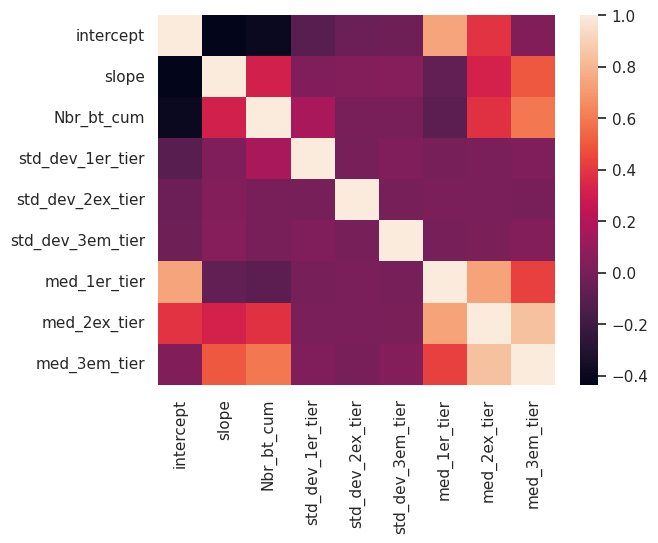

In [ ]:
sns.heatmap(c_df.corr())

### Application du modèle

In [ ]:
#idx: 'intercept'0, 'slope'1, 'Nbr_bt_cum'2, 'std_dev_1er_tier'3, 'std_dev_2ex_tier'4,	'std_dev_3em_tier'5,	'med_1er_tier'6, 'med_2ex_tier'7, 'med_3em_tier'8

In [ ]:
#Application du modèle
X=c_df
#Scaling
X = (X-X.mean())/X.std()
coef = 2
X.iloc[:, 0] = coef*X.iloc[:, 0]
X.iloc[:, 1] = coef*X.iloc[:, 1]
X.iloc[:, 2] = coef*X.iloc[:, 2]
#ajustement des données au model
km.fit(X)
y_km = km.predict(X)

centers data regularised

In [ ]:
#individus centraux des clusters
centers = km.cluster_centers_
# dis-scaling : données centrées réduites ==> don brutes
Xraw = c_df.loc[:, ['intercept', 'slope', 'Nbr_bt_cum', 'std_dev_1er_tier', 'std_dev_2ex_tier',	'std_dev_3em_tier',	'med_1er_tier', 'med_2ex_tier', 'med_3em_tier']].dropna()
centers_dimcoef_sans_scaling = 1/coef *(centers[:, :3]*np.array(Xraw.iloc[:, [0, 1, 2]].std()) + coef*np.array(Xraw.iloc[:, [0, 1, 2]].mean())) # données raw 'intercept' et 'slope'
centers_othDim_sans_scaling = centers*np.array(Xraw.std()) + np.array(Xraw.mean())

centers_sans_scaling = centers_othDim_sans_scaling
# données dimcoef corrigées du coef
centers_sans_scaling[:, :3] = centers_dimcoef_sans_scaling

# Stockage des résultats de détection et de classification sur le parc dans la table Gbl_res

In [ ]:
#Affectation des clusters aux cycles détectés dans c_df
c_df['cluster'] = y_km

In [ ]:
# sauvegarde Gbl-res.csv : table avec les clusters
Gbl_res = Detect_res.merge(c_df['cluster'], how='outer', left_index=True, right_index=True)
Gbl_res.to_csv('Gbl_res.csv')
print(f'{len(c_df)} classifiés')
Gbl_res

745 classifiés


,sn,date_start,date_end,Nbr_bt_cum,linear_compatibility (%),R2_adjustment (%),slope,intercept,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier,last_pt_reg_line,d_conf,med_10pts_av,med_10pts_ap,cluster
0,00001,2019-11-01,2023-07-21,325065.0,100.000000,91.112123,0.001404,-109.258258,32.129734,50.646325,68.507514,54.216867,148.226797,297.808887,347.221455,NaN,NaN,NaN,14.0
1,00002,2019-11-01,2023-07-22,283263.0,100.000000,85.686008,0.000990,-56.602169,244.604260,45.197985,102.599393,61.255743,79.721181,193.146327,223.954906,NaN,NaN,NaN,35.0
2,00003,2019-11-01,2021-12-26,235297.0,99.970588,12.216063,0.000146,27.587584,15.244524,19.315393,31.642800,51.664081,60.648801,74.474681,61.930047,64.839973,55.420710,17.216227,19.0
3,00003,2021-12-27,2023-04-17,376871.0,100.000000,93.453228,0.001819,-18.696939,29.130958,124.977879,98.043116,65.420561,299.504950,513.150516,666.762914,89.865824,549.177954,53.976335,28.0
4,00003,2023-04-18,2023-07-21,101271.0,99.670538,48.281573,0.000172,49.027152,12.212324,16.766080,16.364898,53.951368,51.635265,66.453163,66.475016,NaN,NaN,NaN,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,00546,2019-11-01,2023-07-24,113352.0,79.410036,28.170031,0.000079,35.203456,14.568861,10.773363,12.085861,37.319763,38.424725,42.060988,44.190390,NaN,NaN,NaN,4.0
778,00548,2019-11-01,2023-07-24,23084.0,95.657031,1.901108,-0.000069,10.980442,22.169242,9.759223,9.277079,12.987013,10.537408,12.578616,9.377382,NaN,NaN,NaN,4.0
779,00549,2019-11-01,2023-07-24,23389.0,91.056291,22.395046,0.000275,11.888614,25.544470,7.761738,11.348808,18.487395,16.537145,20.080321,18.325031,NaN,NaN,NaN,4.0
780,00551,2019-11-01,2023-07-24,28302.0,52.441273,49.730979,0.000440,15.512842,19.475487,14.461069,8.878619,19.656020,27.232618,30.265697,27.979685,NaN,NaN,NaN,4.0


# Carte des clusters de trajectoires

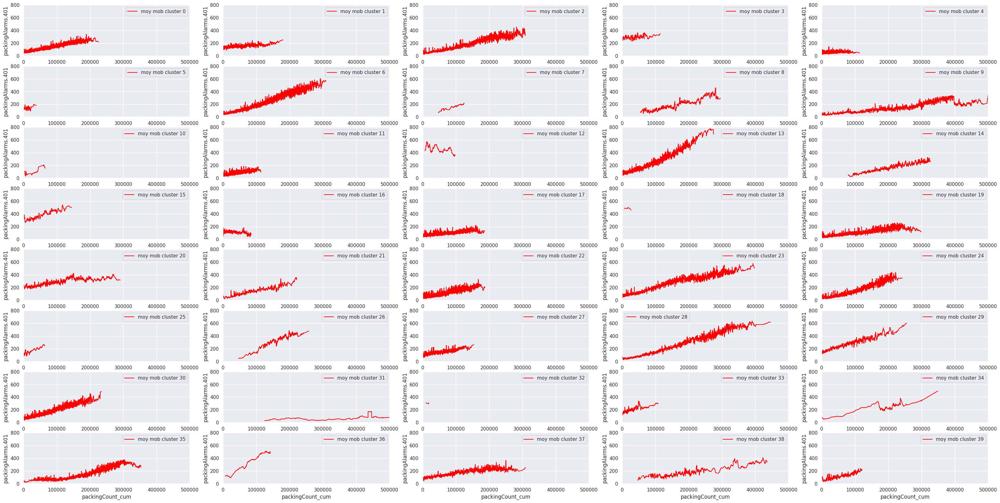

In [ ]:
list_clst_moy_mob =[] # for cluster trend storage

plt.figure(figsize=(40, 20))
for c in range(centers_sans_scaling.shape[0]):
  locus_id = c+1
  plt.subplot(8, 5, locus_id) # le produit des 2 premiers argument doit être égale au nbr de cluster spécifié
  plt.xlabel("packingCount_cum")
  plt.ylabel("packingAlarms.401")

  # regression line
  a = centers_sans_scaling[c][1]
  b = centers_sans_scaling[c][0]
  x = np.linspace(0, 1000000, 10)
  y = a * x + b
  #--------------------
  #filtre par num cluster ==> clst_data
  cluster_set = Gbl_res[Gbl_res.cluster == c]
  lst_data =[]
  for i in range(len(cluster_set)):
    sn = str(cluster_set['sn'].iloc[i]).zfill(5)
    dateStart = cluster_set['date_start'].iloc[i]
    datEnd = cluster_set['date_end'].iloc[i]

    d=Raw_eqv_millier(sn, "rawAlarms.401", dateStart, datEnd).raw_data()
    d = d.replace([np.inf, -np.inf], np.nan)
    d= d.dropna() # #####
    lst_data.append(d)

  #moy_mob
  clst_data = pd.concat(lst_data)
  clst_data = clst_data.sort_values('packingCount_cum',  ascending=True, ignore_index=True)
  clst_data['moy_mob'] = clst_data['packing'].rolling(10, 5).mean()
  #----
  list_idx_sup=[]
  for j in clst_data.index:
    if np.abs(clst_data['moy_mob'][j] - (a*clst_data['packingCount_cum'][j]+b)) > 100:
      list_idx_sup.append(j)
  if len(list_idx_sup) > 0:
    clst_data = clst_data.drop(list_idx_sup)
  #-------------------------storage-------------------------------------
  clst_moy_mob = clst_data[['packingCount_cum', 'moy_mob']]
  clst_moy_mob.reset_index(drop=True, inplace=True)
  clst_moy_mob.rename(columns={'moy_mob':f'cluster {c}'}, inplace=True)
  list_clst_moy_mob.append(clst_moy_mob)
  #-----------------------------------------------------------------------
  plt.plot(clst_data['packingCount_cum'], clst_data['moy_mob'], color='red', label='moy mob cluster {}'.format(c))
  # IC = 300
  # plt.fill_between(clst_data['packingCount_cum'], (clst_data['moy_mob']-IC), (clst_data['moy_mob']+IC), color='red', alpha=.1, label='cluster {}'.format(c))
  #
  plt.ylim([0, 800])
  plt.xlim([0, 500000])
  plt.legend(loc="best")
plt.show()

================================================================================================================================================================

# Espace visualisation :trajectoire cluster et courbe cycle

## Construction de quelques fonctions de visualisation

### Fonction bi_graph pour visualiser ensemble la trajectoire d'un cluster et la courbe d'un cycle

In [ ]:
# Fonction bi_graph pour visualiser ensemble la trajectoire d'un cluster et la courbe d'un cycle
def bi_graph(cluster_num, sn, dateStart, datEnd, xmax=1000000, ymax=800, figsize_x = 5, figsize_y = 3):

  plt.figure(figsize=(figsize_x, figsize_y))
  plt.xlabel("packingCount_cum")
  plt.ylabel("packing")

  # regression line
  a = centers_sans_scaling[cluster_num][1]
  b = centers_sans_scaling[cluster_num][0]
  x = np.linspace(0, 1000000, 10)
  y = a * x + b

  #filtre par num cluster ==> clst_data
  cluster_set = Gbl_res[Gbl_res.cluster == cluster_num]
  lst_data =[]
  for i in range(len(cluster_set)):
    sn = str(cluster_set['sn'].iloc[i]).zfill(5)
    dateStart = cluster_set['date_start'].iloc[i]
    datEnd = cluster_set['date_end'].iloc[i]

    d=Raw_eqv_millier(sn, "rawAlarms.401", dateStart, datEnd).raw_data()
    d = d.replace([np.inf, -np.inf], np.nan)
    d= d.dropna()
    lst_data.append(d)

  #moy_mob
  clst_data = pd.concat(lst_data)
  clst_data = clst_data.sort_values('packingCount_cum',  ascending=True, ignore_index=True)
  clst_data['moy_mob'] = clst_data['packing'].rolling(10, 5).mean()
  #----
  list_idx_sup=[]
  for j in clst_data.index:
    if np.abs(clst_data['moy_mob'][j] - (a*clst_data['packingCount_cum'][j]+b)) > 300:# outlier moy_mob
      list_idx_sup.append(j)
  if len(list_idx_sup) > 0:
    clst_data = clst_data.drop(list_idx_sup)
  #----
  plt.plot(clst_data['packingCount_cum'], clst_data['moy_mob'], color='red', label='Trend cluster {}'.format(cluster_num))
  # IC = 300
  # plt.fill_between(clst_data['packingCount_cum'], (clst_data['moy_mob']-IC), (clst_data['moy_mob']+IC), color='red', alpha=.1, label='cluster {}'.format(cluster_num))

  #courbe cycle
  d=Raw_eqv_millier(sn, "rawAlarms.401", dateStart, datEnd).raw_data()
  d = d.replace([np.inf, -np.inf], np.nan)
  d= d.dropna()
  plt.plot(d["packingCount_cum"], d["packing"], color ='grey', label=f'M{sn}: {dateStart} to {datEnd}')

  plt.ylim([0, ymax])
  plt.xlim([0, xmax])
  plt.legend(loc="best")

### fonction clst_graph de présentation d'1 cluster avec toutes ces courbes

In [ ]:
# avec trend curve/reg line/moy_mob**
def clst_graph(cluster_num, xmax=1000000, ymax=800, figsize_x = 20, figsize_y = 8):

  col_lst = ['green','blue', 'chocolate', 'yellow', 'orange', 'khaki', 'lawngreen', 'violet']

  #PLOT
  plt.figure(figsize=(figsize_x, figsize_y))
  plt.xlabel("packingCount_cum")
  plt.ylabel("packing")

  # regression line
  a = centers_sans_scaling[cluster_num][1]
  b = centers_sans_scaling[cluster_num][0]
  x = np.linspace(0, 1000000, 10)
  y = a * x + b
  # intervalle de conf
  # IC = 300
  # plt.plot(x, y, color='red')
  # plt.fill_between(x, (y-IC), (y+IC), color='red', alpha=.1, label='cluster {}'.format(cluster_num))

  #filtre par num cluster ==> plot each cycle
  cluster_set = Gbl_res[Gbl_res.cluster == cluster_num]

  lst_data =[]
  for i in range(len(cluster_set)):
    sn = str(cluster_set['sn'].iloc[i]).zfill(5)
    dateStart = cluster_set['date_start'].iloc[i]
    datEnd = cluster_set['date_end'].iloc[i]

    d=Raw_eqv_millier(sn, "rawAlarms.401", dateStart, datEnd).raw_data()
    d = d.replace([np.inf, -np.inf], np.nan)
    d= d.dropna()
    lst_data.append(d)
    #color choice
    index_col = i % len(col_lst)
    col_choice = col_lst[index_col]
    #plot
    plt.plot(d["packingCount_cum"], d["packing"], color =col_choice, label=f'M{sn}: {dateStart} to {datEnd}')

  #moy_mob
  clst_data = pd.concat(lst_data)
  clst_data = clst_data.sort_values('packingCount_cum',  ascending=True, ignore_index=True)
  clst_data['moy_mob'] = clst_data['packing'].rolling(10, 5).mean()
  #----
  list_idx_sup=[]
  for j in clst_data.index:
    if np.abs(clst_data['moy_mob'][j] - (a*clst_data['packingCount_cum'][j]+b)) > 300:# outlier moy_mob
      list_idx_sup.append(j)
  if len(list_idx_sup) > 0:
    clst_data = clst_data.drop(list_idx_sup)
  #----
  plt.plot(clst_data['packingCount_cum'], clst_data['moy_mob'], color='red', label='Trend cluster {}'.format(cluster_num))
  # plt.plot(clst_data['packingCount_cum'], clst_data['moy_mob'], label='moyenne_mobile', color='red')
  # IC = 300
  # plt.fill_between(clst_data['packingCount_cum'], (clst_data['moy_mob']-IC), (clst_data['moy_mob']+IC), color='red', alpha=.1, label='cluster {}'.format(cluster_num))

  plt.ylim([0, ymax])
  plt.xlim([0, xmax])
  plt.legend(loc="best")

  #table des individus du cluster
  return Gbl_res[Gbl_res['cluster']==cluster_num]

## Visualisation trajectoires clusters



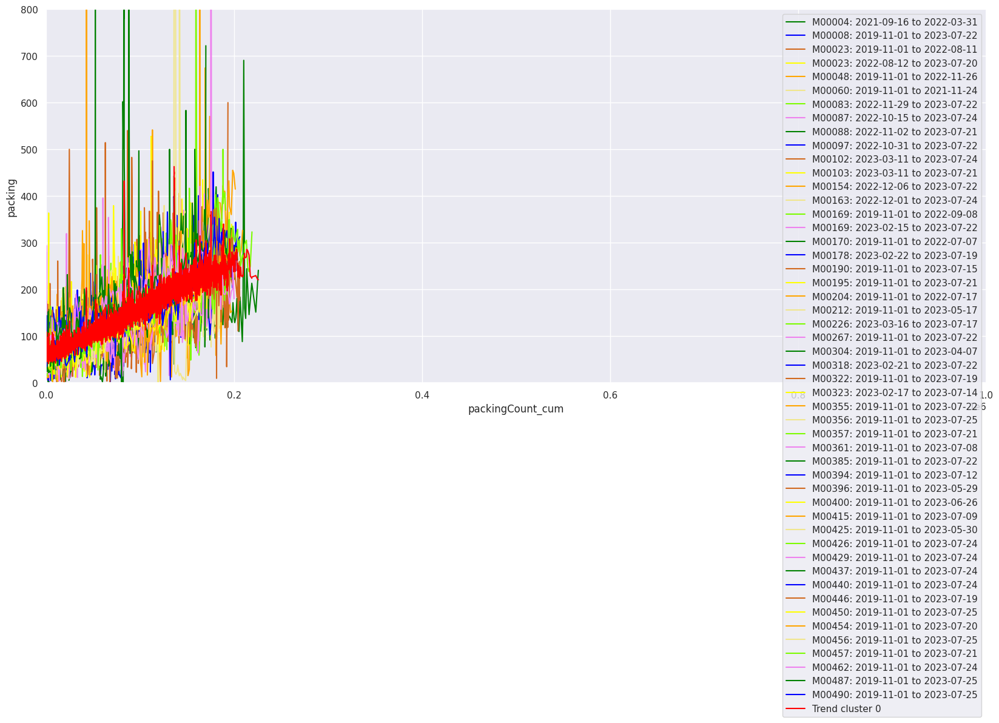

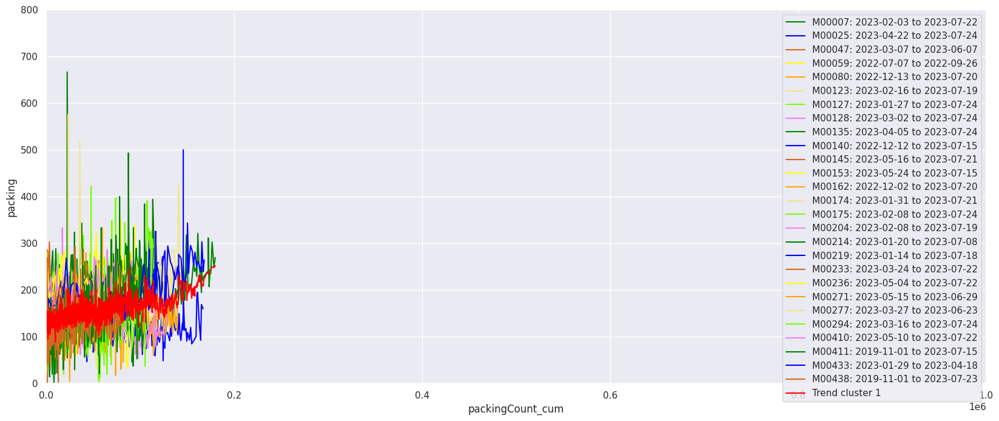

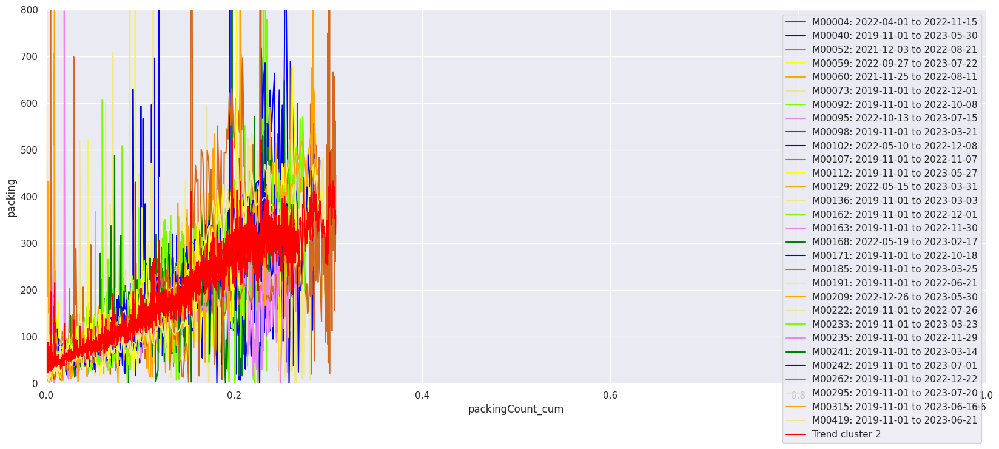

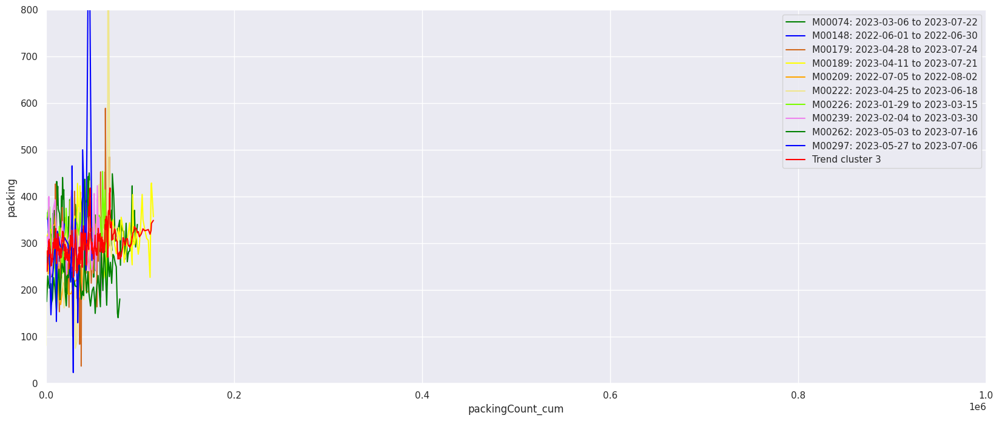

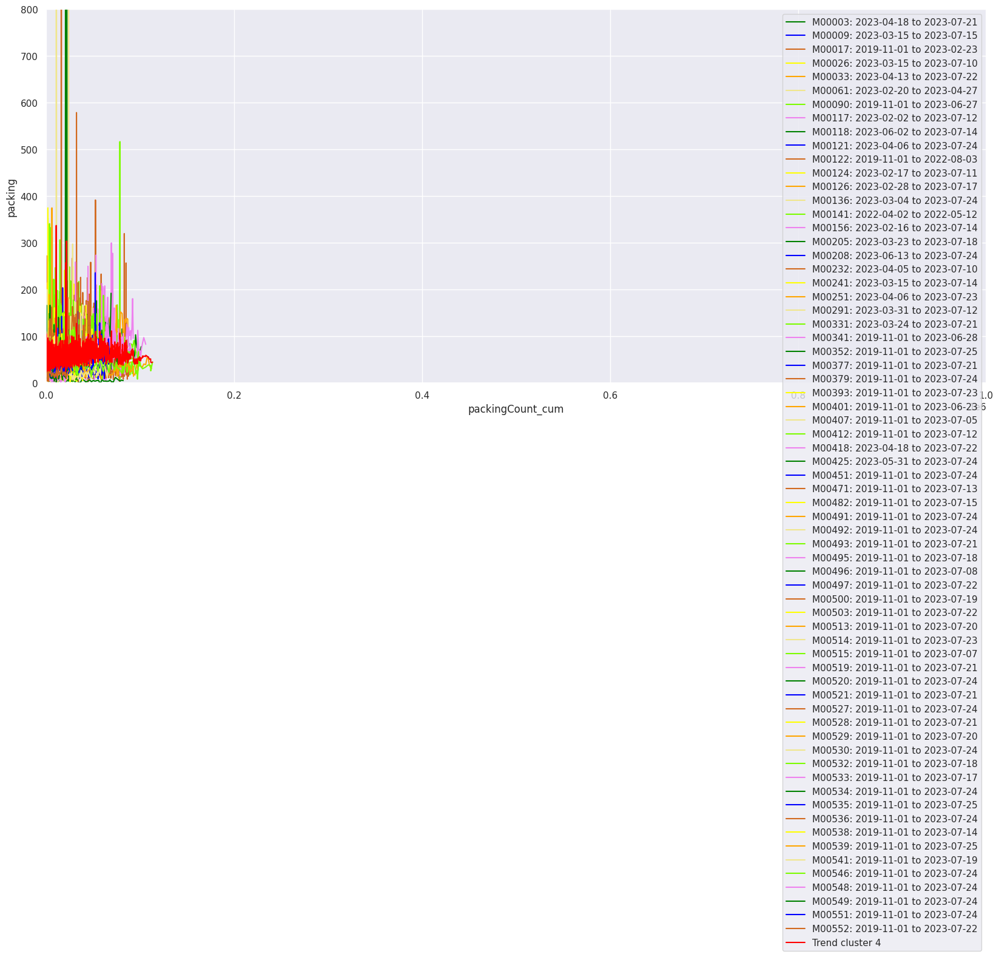

...

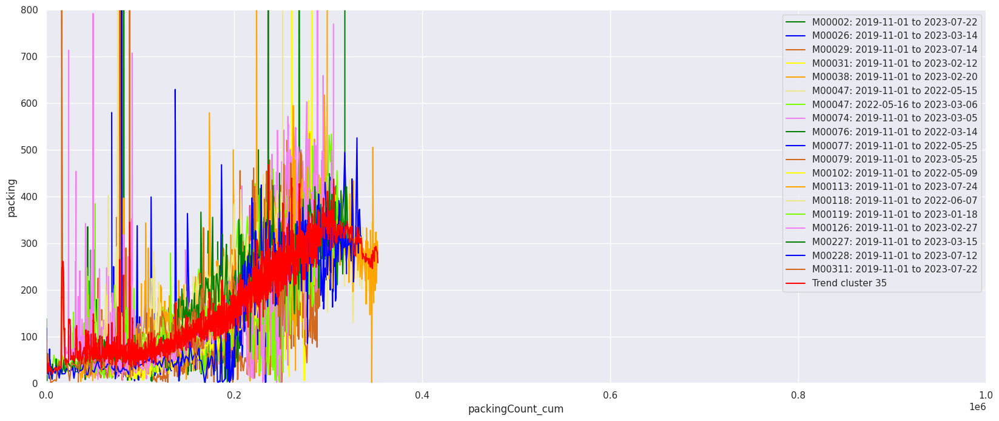

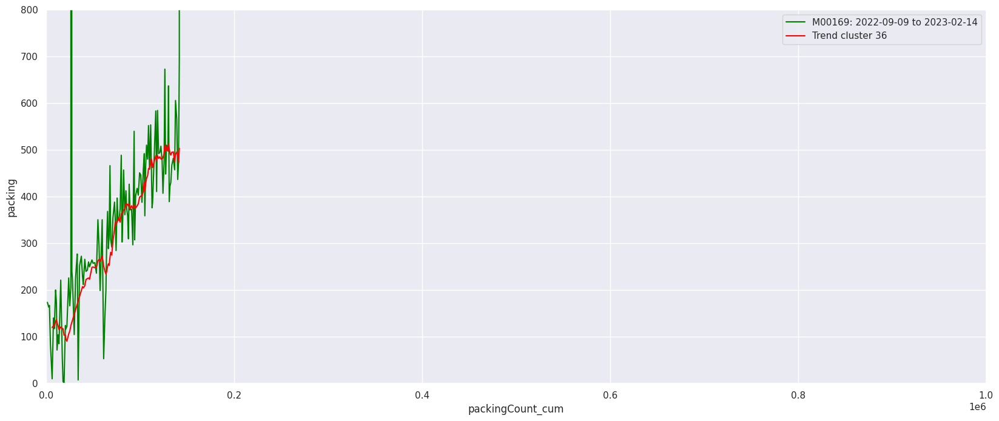

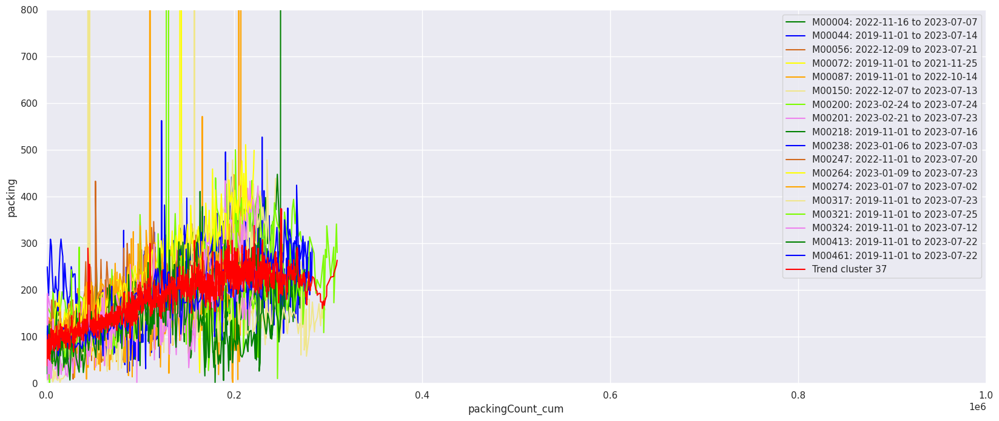

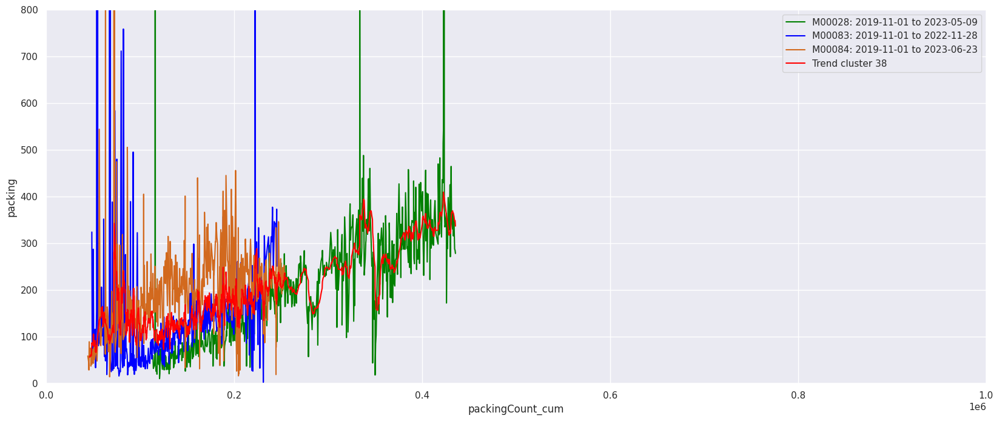

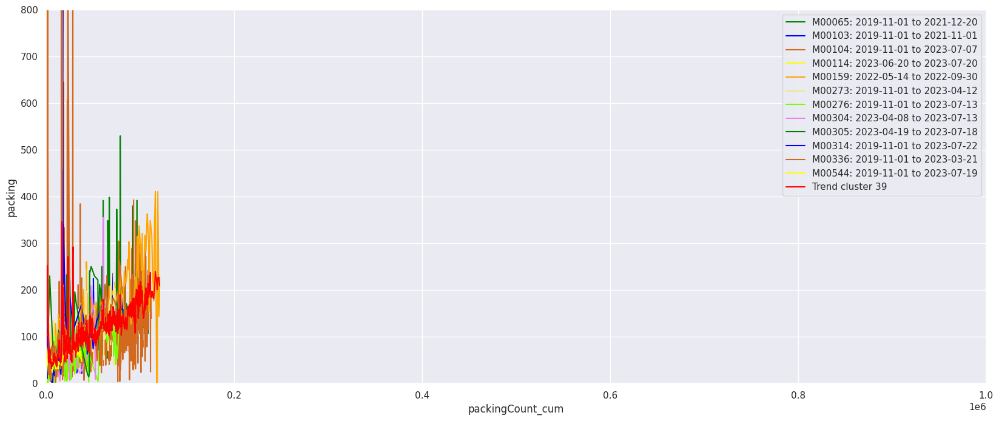

In [ ]:
#voir tous les trajectoires par cluster
for i in range(centers.shape[0]):
  clst_graph(i)

# ======================================== FIN PROGRAMME AutoGenCyclesVB ===============================================================================================

===========================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

# **FILTRAGE ET VISUALISATION DE RESULTATS**

In [ ]:
# exécution de l'algo de détection sur la M5
rps = cycle_detector('00005', '2019-11-01', '2023-07-20')
rps

,sn,date_start,date_end,Nbr_bt_cum,linear_compatibility (%),R2_adjustment (%),slope,intercept,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier,last_pt_reg_line,d_conf,med_10pts_av,med_10pts_ap
0,00005,2019-11-01,2021-07-20,181980.0,100.0,86.889068,0.001440,41.042166,17.457222,28.689144,30.439538,138.563050,220.804228,266.541823,303.105505,79.213684,274.486313,56.422673
1,00005,2021-07-21,2021-12-12,214482.0,100.0,90.957510,0.001542,17.471311,27.968916,29.111191,73.028010,73.120494,193.227092,275.232257,348.193064,82.854795,281.932941,40.362074
2,00005,2021-12-13,2022-08-07,281681.0,100.0,91.911503,0.001674,-1.198709,24.181855,43.478903,103.853336,74.770137,232.994108,399.849398,470.468204,87.959998,407.242330,42.842220
3,00005,2022-08-08,2023-07-19,474478.0,100.0,83.228672,0.000615,13.141681,32.891735,52.390947,52.822231,74.180968,143.382617,264.571642,305.179587,NaN,NaN,NaN


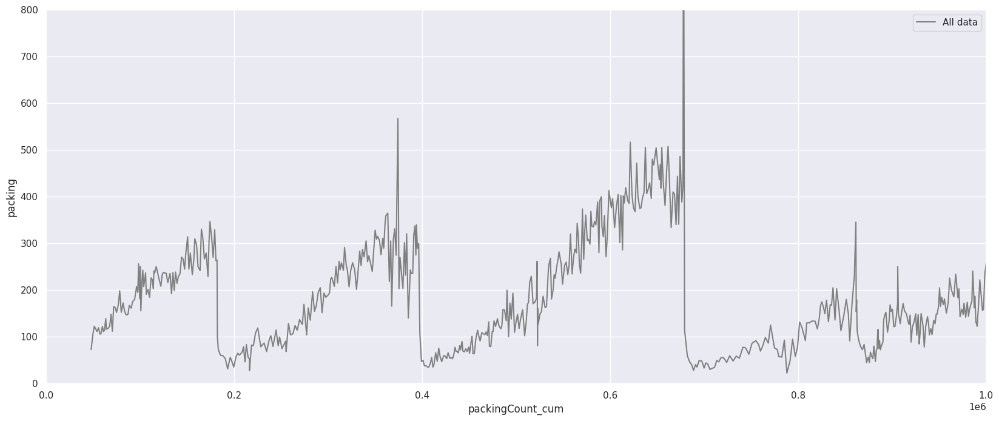

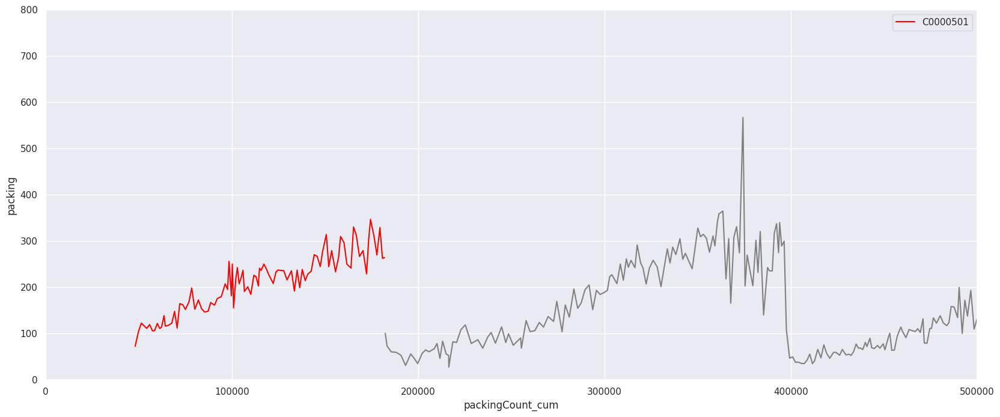

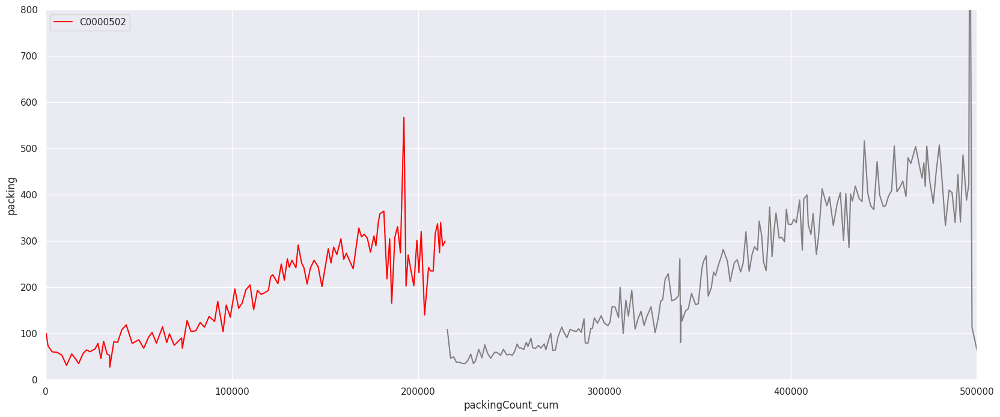

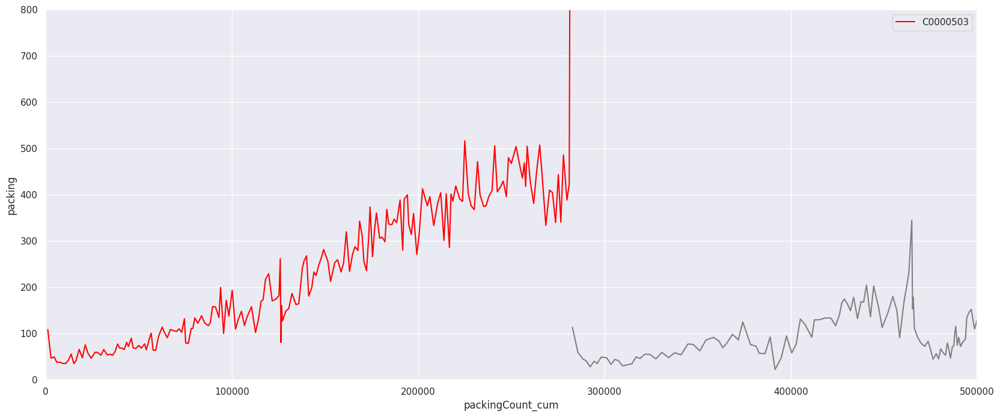

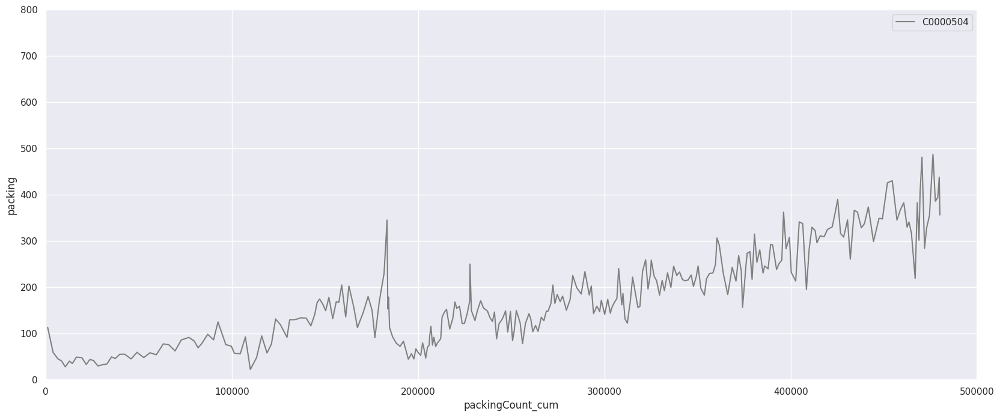

In [ ]:
#graphes des resultats de détection
machine_graphs(rps)

In [ ]:
# #filtre du cluster 15 par exemple
Gbl_res[Gbl_res['cluster']==15]

,sn,date_start,date_end,Nbr_bt_cum,linear_compatibility (%),R2_adjustment (%),slope,intercept,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier,last_pt_reg_line,d_conf,med_10pts_av,med_10pts_ap,cluster
77,00043,2022-07-04,2022-09-11,118947.0,100.000000,90.961902,0.002476,242.691034,19.794770,33.986244,99.883893,307.692308,394.779772,475.708502,537.202510,90.364758,492.488555,32.569078,15.0
267,00145,2022-06-09,2022-07-10,39945.0,89.330567,75.344461,0.002989,318.442509,21.080933,70.061948,56.145025,343.034056,404.572232,399.152991,437.830596,91.295876,392.383418,31.635562,15.0
418,00217,2022-07-20,2022-08-16,43031.0,99.961731,73.345045,0.001306,261.475978,38.476164,21.516530,35.402829,246.579602,307.095344,316.764954,317.670900,77.528684,315.319524,68.891807,15.0
435,00225,2022-09-13,2022-11-15,86405.0,99.996137,61.766778,0.002926,281.288752,121.399241,118.585701,151.085530,339.832020,411.441144,536.423841,534.073063,73.505828,578.320669,159.964492,15.0
437,00225,2023-06-05,2023-07-21,68393.0,99.961622,74.079609,0.001868,350.410141,67.695377,78.669697,56.519677,351.158645,371.845744,428.882434,478.159244,NaN,NaN,NaN,15.0
461,00237,2022-10-06,2023-01-25,144281.0,100.000000,66.936468,0.001311,324.870335,149.588392,65.027992,100.920945,270.619946,448.644025,483.746130,513.993083,65.956634,476.739698,143.594244,15.0
491,00262,2022-12-23,2023-05-02,127861.0,99.999999,86.281723,0.001975,254.064660,69.798676,82.159883,82.686071,335.138062,359.808112,421.929629,506.647575,59.378930,489.118213,204.810217,15.0
547,00301,2023-05-29,2023-07-24,105099.0,74.333147,81.268125,0.002248,248.045265,246.374587,84.204074,119.598733,323.080649,332.449909,449.704142,484.302416,NaN,NaN,NaN,15.0
634,00391,2023-05-26,2023-07-24,53438.0,90.305100,72.943942,0.001937,243.085141,104.342243,21.918601,41.478301,291.863765,279.792746,340.211132,346.569308,NaN,NaN,NaN,15.0


In [ ]:
# #filtre par numero de série de machine pour voir les clusters associés
filtre_Gbl = Gbl_res[Gbl_res.sn=='00005']
filtre_Gbl

,sn,date_start,date_end,Nbr_bt_cum,linear_compatibility (%),R2_adjustment (%),slope,intercept,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier,last_pt_reg_line,d_conf,med_10pts_av,med_10pts_ap,cluster
8,00005,2019-11-01,2021-07-20,181980.0,100.0,86.889068,0.001440,41.042166,17.457222,28.689144,30.439538,138.563050,220.804228,266.541823,303.105505,79.213684,274.486313,56.422673,30.0
9,00005,2021-07-21,2021-12-12,214482.0,100.0,90.957510,0.001542,17.471311,27.968916,29.111191,73.028010,73.120494,193.227092,275.232257,348.193064,82.854795,281.932941,40.362074,24.0
10,00005,2021-12-13,2022-08-07,281681.0,100.0,91.911503,0.001674,-1.198709,24.181855,43.478903,103.853336,74.770137,232.994108,399.849398,470.468204,87.959998,407.242330,42.842220,6.0
11,00005,2022-08-08,2023-07-19,474478.0,100.0,83.228672,0.000615,13.141681,32.891735,52.390947,52.822231,74.180968,143.382617,264.571642,305.179587,NaN,NaN,NaN,9.0


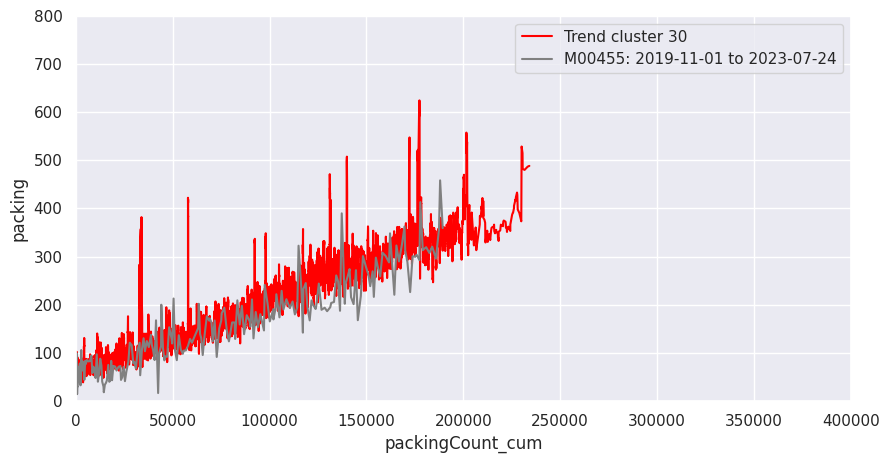

In [ ]:
#visualiser ensemble la trajectoire du cluster 30 et la courbe du cycle |'00005', 2019-11-01, 2021-07-20|
bi_graph(30, '00005', '2019-11-01', '2021-07-20', xmax=400000, ymax=800, figsize_x = 10, figsize_y = 5)

,sn,date_start,date_end,Nbr_bt_cum,linear_compatibility (%),R2_adjustment (%),slope,intercept,std_dev_1er_tier,std_dev_2ex_tier,std_dev_3em_tier,med_1er_tier,med_2ex_tier,med_3em_tier,last_pt_reg_line,d_conf,med_10pts_av,med_10pts_ap,cluster
77,00043,2022-07-04,2022-09-11,118947.0,100.000000,90.961902,0.002476,242.691034,19.794770,33.986244,99.883893,307.692308,394.779772,475.708502,537.202510,90.364758,492.488555,32.569078,15.0
267,00145,2022-06-09,2022-07-10,39945.0,89.330567,75.344461,0.002989,318.442509,21.080933,70.061948,56.145025,343.034056,404.572232,399.152991,437.830596,91.295876,392.383418,31.635562,15.0
418,00217,2022-07-20,2022-08-16,43031.0,99.961731,73.345045,0.001306,261.475978,38.476164,21.516530,35.402829,246.579602,307.095344,316.764954,317.670900,77.528684,315.319524,68.891807,15.0
435,00225,2022-09-13,2022-11-15,86405.0,99.996137,61.766778,0.002926,281.288752,121.399241,118.585701,151.085530,339.832020,411.441144,536.423841,534.073063,73.505828,578.320669,159.964492,15.0
437,00225,2023-06-05,2023-07-21,68393.0,99.961622,74.079609,0.001868,350.410141,67.695377,78.669697,56.519677,351.158645,371.845744,428.882434,478.159244,NaN,NaN,NaN,15.0
461,00237,2022-10-06,2023-01-25,144281.0,100.000000,66.936468,0.001311,324.870335,149.588392,65.027992,100.920945,270.619946,448.644025,483.746130,513.993083,65.956634,476.739698,143.594244,15.0
491,00262,2022-12-23,2023-05-02,127861.0,99.999999,86.281723,0.001975,254.064660,69.798676,82.159883,82.686071,335.138062,359.808112,421.929629,506.647575,59.378930,489.118213,204.810217,15.0
547,00301,2023-05-29,2023-07-24,105099.0,74.333147,81.268125,0.002248,248.045265,246.374587,84.204074,119.598733,323.080649,332.449909,449.704142,484.302416,NaN,NaN,NaN,15.0
634,00391,2023-05-26,2023-07-24,53438.0,90.305100,72.943942,0.001937,243.085141,104.342243,21.918601,41.478301,291.863765,279.792746,340.211132,346.569308,NaN,NaN,NaN,15.0


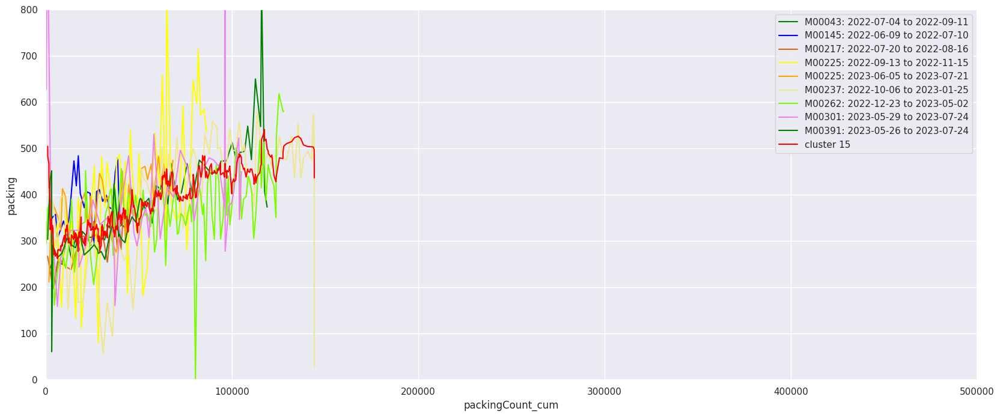

In [ ]:
# présentation du cluster 15 avec toutes ces courbes
clst_graph(15, xmax=500000, ymax=800, figsize_x = 20, figsize_y = 8)